# Neural Style Transfer


### Underlying Principal
----------------------------

The principal is simple: we define two distances, one for the content(Dc: it measures how different the content is btw the two images) and one for the style(Ds: measures how different the style is btw the two images). Then, we take a third image, the input, and transform it to minimize both its content-distance with the content-image and its style-distance with the style-image.

Importing Packages and Selecting a Device:
---------------------------------------------------------------

 ``torch``, ``torch.nn``, ``numpy`` (indispensables packages for
neural networks with PyTorch)
``torch.optim`` (efficient gradient descents)
``PIL``, ``PIL.Image``, ``matplotlib.pyplot`` (load and display images)
``torchvision.transforms`` (transform PIL images into tensors)
``torchvision.models`` (train or load pre-trained models)
``copy`` (to deep copy the models; system package)

-------------


In [1]:
from __future__ import print_function
from torchvision.utils import save_image
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random


import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [2]:
device = torch.device("cuda")

# Loading the Images
-----------------------------------

Importing style and content images. The original PIL images have values between 0 and 255, bu when they are transformed into torch tensors, their values are converted to be between 0 and 1. The images also need to be resized to have the same dimensions.
An important detail to note is that neural networks from the torch library are trained with tensor values ranging from 0-1. If you try to feed the networks with 0-255 tensor images, then the activated feature maps will be unable to sense the intended content and style. 
However, pre-trained networks from the Caffe Library are trained with 0 to 255 tensor images.

Links:
--------
`picasso.jpg <https://pytorch.org/tutorials/_static/img/neural-style/picasso.jpg>`

`dancing.jpg <https://pytorch.org/tutorials/_static/img/neural-style/dancing.jpg>`


In [3]:
# Desired size of the output image
imsize = 512

loader = transforms.Compose([
    transforms.Resize(imsize), #scale imported image
    transforms.CenterCrop(imsize), # incase I input images of aspect ratio other then 1:1
    transforms.ToTensor()]) #transform it into a torch tensor

def image_loader(image_name):
    image = Image.open(image_name)
    
    #fake batch dimensions are required to fit the network's input dimensions
    image = loader(image).unsqueeze(0) #this will add those dimensions
    return image.to(device, torch.float)

style_img = image_loader("./picasso.jpg")
content_img = image_loader("./dancing.jpg")

assert style_img.size() == content_img.size()

# we need the style and content images to be of the same size

Now, let's create a function that displays an image by reconverting a copy of it to PIL format and displaying the copy using ``plt.imshow``. We will try displaying the content and style images to ensure they were imported correctly.

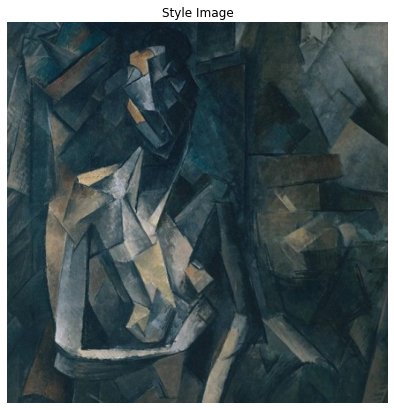

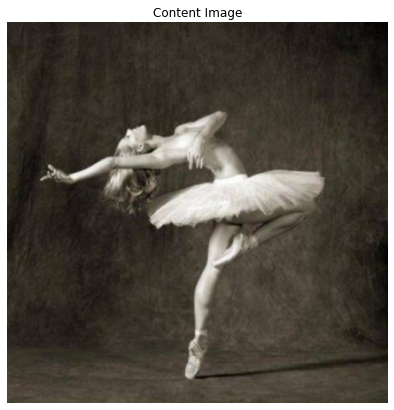

In [4]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.figure(figsize=(7,7))
    plt.axis('off')
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated
    

imshow(style_img, title='Style Image')
imshow(content_img, title='Content Image')

<Figure size 432x288 with 0 Axes>

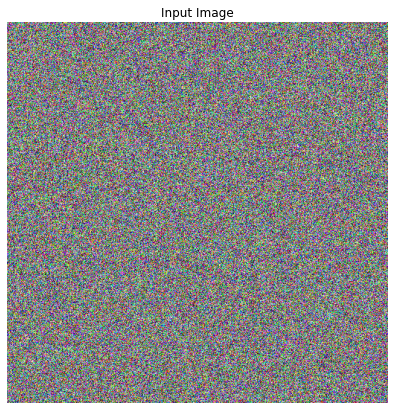

In [5]:
#input_img = style_img.clone()
# if you want to use white noise instead uncomment the below line:
input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

# Importing the Model
------------------------------------------
Now we need to import a pre-trained neural network. we will use 19 layer VGG network like the one used in the paper.

pyTorch's implementation of VGG is a module divided into two child ``Sequential`` modules: features(containing convolution and pooling layers), and ``classifier``(containing the fully connected layers). We will use the ``features`` module because we need the output of the individual convolution layers to measure content and style loss. Some layers have different behavior during training than evaluation, so we must set the network to evaluation mode using .eval().

In [6]:
cnn = models.vgg19(pretrained=True).features.to(device).eval() #.features allows access to all weights and biases

# Custom Modules
------------------------------

The implementation is pretty simple we will use torchvisio.transforms to apply certain augmentation. 
If we want to use multiple augmentations we us torchvision.transforms.compose to pass a list of transforms that can be applied.
We will be appplying the transforms on the input for each iteration of the CNN.
So like model(transform(input_img)) using Kronia

1)For high frequency noise that we are getting in the style we will use Gussian noise transfrom.

class AddGussianNoise(object):
    def __init__(self, std = 1., mean = 0.):
        self.std = std
        self.mean = mean
    def __call__(self, tensor):
        return tensor + torch.randn(torch.size())*self.std + self.mean
    def __repr__(self):
        return self.__class.__name__ + '(mean = {0}, std = {1})'.format(self.mean ,self.std)
to add guassian noise to a tensor

In [7]:
#defining a custom layer for guassian noise transformation
transform = transforms.Compose([transforms.ToPILImage(), transforms.RandomHorizontalFlip(p=0.5), 
                                transforms.RandomVerticalFlip(p=0.5),
                                transforms.ToTensor()])
class AddGuassianNoise(nn.Module):
    def __init__(self, std, mean):
        super(AddGuassianNoise, self).__init__()
        self.std = torch.tensor(std)
        self.mean = torch.tensor(mean)
    
    def forward(self, img):
        img = img + (torch.randn(img.size())*self.std + self.mean).to(device)
        return img
    
class augmentation(nn.Module):
    def __init__(self):
        super(augmentation, self).__init__()
        self.option = int(np.random.uniform(1,4))
    def forward(self, img):
        if(self.option==1): #Horizontal flip
            w = img.shape[-1]
            return img[..., torch.arange(w - 1, -1, -1, device=device)]
        elif(self.option==2): #Vertical flip
            h = img.shape[-2]
            return img[..., torch.arange(h-1,-1,-1, device=device),:]
        elif(self.option==3): #rotate 180
            return torch.flip(img, [-2, -1])
        else:
            raise RuntimeError('Unrecognized Augmentation')
            
# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std
    

## Loss Modules

Content Loss
-------------------

The content loss is a function that represents a weighted version of the content distance for an individual layer. The function takes the feature map $F_{XL}$ of a layer $ _{L}$ in a network processing input $ _{X}$ and returns the weighted content distance $W_{CL}.D_{C}^{L}$(X,C) between the image $ _{X}$ and the content image $ _{C}$. The feature maps of the content image($V_{CL}$) must be known by the function in order to calculate the content distance. We implement this function as a torch module with a constructor that takes $V_{CL}$ as an input. The distance $||F_{XL} - F_{CL}||^{2}$ is the mean square error between the two sets of feature maps, and can be computed using ``nn.MSEloss``

We will add this content loss module directly after the convolution layer(s) that are being used to compute the content distance. This way each time the network is fed an input image the content losses will be computed at the desired layers and because of auto grad, all the gradients will be computed. Now, in order to make the content loss layer transparent we must define a ``forward`` method that computes the content loss and then returns the layer’s input. The computed loss is saved as a parameter of the module.

In [8]:
class ContentLoss(nn.Module):
    
    def __init__(self, target,):
        
        super(ContentLoss, self).__init__()
        #The point of the arguments/parameters of the super() is to specify its use
        #-----https://docs.python.org/2/library/functions.html#super----
        #In this case its being used to refer to parent class
        
        # we 'detach' the target content from the tree used 
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target =  target.detach()
        
    def forward(self, input):
        #self.loss = F.mse_loss(input, self.target)
        self.loss = F.l1_loss(input, self.target)
        return input

### Style Loss
-----------

The style loss module is implemented similarly to the content loss module. It will as a transparent layer in a network that computes the style loss of that layer. In order to calculate the style loss, we need to compute the gram matrix $G_{XL}$. 

A ``Gram Matrix`` is the results of multplying a given matrix by its transposed matrix.

In this application the given matrix is a reshaped version of the feature maps $F_{XL}$ of a layer $ _{L}$.$F_{XL}$ is reshaped to form $\hat F_{XL}$, a $ _{K}X_{N}$ matrix, where $ _{K}$ is the number of feature maps at layer $ _{L}$ and $ _{N}$ is the length of any vectorized feature map $F^{k}_{XL}$. For example,the first line of $\hat F_{XL}$ corresponds to the first vectorized feature map $F^{1}_{XL}$.

Finally, the gram matrix must be normalized by deviding each element by total number of elements in the matrix. This normalization is to counteract the fact that $\hat F_{XL}$ matrics with a large $ _{N}$ dimension yeild larger values in the Gram matrix. These larger values wil cause the first layers (before pooling layers) to have impact during the gradient descent. Style features tend to be in the deeper layers of the network so this normalization step is crucial.

In [9]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = self.gram_matrix(target_feature.detach()).detach()
        
    def gram_matrix(self, input):
        a, b, c, d = input.size()  # a=batch size(=1)
        # b=number of feature maps
        # (c,d)=dimensions of a f. map (N=c*d)
        features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL
        G = torch.mm(features, features.t())  # compute the gram product
        # we 'normalize' the values of the gram matrix
        # by dividing by the number of element in each feature maps.
        return G.div(a * b * c * d)

    def forward(self, input):
        G = self.gram_matrix(input)
        #self.loss = F.mse_loss(G, self.target)
        self.loss = F.l1_loss(G, self.target)
        return input

The Gram matrix is used to obtain information about the texture of the style image.
Consider two vectors(flattened feature map from a CNN layer) when you perform the DOT product of two vectors a,b the resultant gives the projected length of vector a on b, times the length of vector b.

More intuitively DOT product represents how close two vectors are to eachother. Therefore the greater the product, the more they occur toghther and thus we are able to extract information about the pattern of a image.

GRAM Matrix is simple all possible INNER product combinations amoung the flattend feature maps of a layer. (Inner product and dot product are the same thing as far as we are concerned).

-------
Now the style loss module looks almost exactly like the content loss module. Now compute the style loss between the input image and the style image

# Model Renaming/Creation

VGG networks are trained on images with each channel normalized by mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225]. We will use them to normalize the image before sending it into the network.\
For more detail check [here](https://pytorch.org/docs/stable/torchvision/models.html)

A ``Sequential`` module contains an ordered list of child modules. For instance, ``vgg19.features`` contains a sequence (Conv2d, ReLU, MaxPool2d, Conv2d, ReLU…) aligned in the right order of depth. We need to add our content loss and style loss layers to the new model. To do this we must create a new ``Sequential`` model that has content loss and style loss modules along with imported layers from VGG.\
<font color=Red> Replacing ``MaxPool2d`` with ``AvgPool2d``</font>\

In [10]:
def rename_model(model, activation_include=True):
    """Rename the VGG model Layers and add to a new sequential"""
    cnn = copy.deepcopy(model)
    renamed_model = nn.Sequential()
     # increment every time we see a conv
    for i,layer in enumerate(cnn.children()):
        
        """ rename the VGG layers"""
        if isinstance(layer, nn.Conv2d):
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            if activation_include==False:
                continue
            name = 'pool_{}'.format(i)
            layer = nn.AvgPool2d(layer.kernel_size, layer.stride)
            ### keep steps below 300 otherwise loss comes as nan
            
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        cnn.cpu()
        renamed_model.add_module(name, layer)#adds a child module to the current module 'model'
        #https://pytorch.org/docs/master/generated/torch.nn.Module.html#torch.nn.Module
    return renamed_model.to(device)

In [11]:
# desired depth layers to compute style/content losses :
#content_layers_default = ['conv_19','conv_21']
#style_layers_default = ['conv_0','relu_1','relu_3','conv_21','conv_23','relu_24','conv_25']
content_layers_default = ['relu_11']
style_layers_default =  ['relu_1','relu_3','relu_6','relu_8','relu_13']

"""content_layers_default = ['conv_0', 'relu_1', 'conv_2','relu_3','conv_4']
style_layers_default = ['relu_1','conv_2','relu_3','conv_5','relu_6','conv_7']
"""
def get_style_model_and_losses(cnn, style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    """
        CNN:  It is the renamed model provided by the above function.
        content_layers: They are layers after which the function will insert a content loss layer.
        style_layers:  They are the layers after which the function will insert a style loss layer.
    """
    
    #Define Normalization layer
    cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    
    #Guassian noise transform
    guassiannoise =  AddGuassianNoise(0.001,0.).to(device)
    
    #Data augmentation
    augment =  augmentation()

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(guassiannoise,augment,normalization)
    cnn = rename_model(cnn).to(device)
    # increment every time we see a conv
    for name,layer in cnn.named_children():
        model.add_module(name,layer)
        """ Add content loss layers and style loss layers"""
        if name in content_layers:
            i = content_layers.index(name)
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            i = style_layers.index(name)
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)
        
    # now we trim off the layers after the last content and style loss layer
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
    cnn.to(device)
    model = model[:(i + 1)]
    return model, style_losses, content_losses

# Gradient Descent
------------------------------------

As Leon Gatys, the author of the algorithm, suggested [here](https://discuss.pytorch.org/t/pytorch-tutorial-for-neural-transfert-of-artistic-style/336/20?u=alexis-jacq), we will use L-BFGS algorithm to run our gradient descent. Unlike training a network, we want to train the input image in order to minimise the content/style losses. We will create a PyTorch L-BFGS optimizer ``optim.LBFGS`` and pass our image to it as the tensor to optimize.

In [12]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient (adds the input to the computational graph to be recorded)
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

Finally, we must define a function that performs the neural transfer. For each iteration of the networks, it is fed an updated input and computes new losses. We will run the ``backward`` methods of each loss module to dynamicaly compute their gradients. The optimizer requires a “closure” function, which re-evaluates the module and returns the loss.\
We still have one final constraint to address. The network may try to optimize the input with values that exceed the 0 to 1 tensor range for the image. We can address this by correcting the input values to be between 0 to 1 each time the network is run.\
Through this function we update(optimize) the weights(Input_img) to minimize the loss value and get a style transfered Image.

-----------------------------------
To visualize what each layer is most concerned with we set ``style_wieght`` to zero and run the training process on a random ``input_img`` using different layer as the content layer

In [13]:
# Feature visualization using hooks for the training of the model
visualizations= {}
def hook_fn(m,i,o):
    visualizations[m]=o.squeeze(0)
    
def hook_them_layers(cnn):
    for name, layer in cnn.named_children():
        if isinstance(layer,nn.Sequential):
            hook_them_layers(layer)
        elif isinstance(layer,(nn.Conv2d,nn.ReLU,nn.MaxPool2d,nn.AvgPool2d,nn.BatchNorm2d)):
            layer.register_forward_hook(hook_fn)
        else: 
            pass

In [14]:
def run_style_transfer(cnn, content_img, style_img, input_img, num_steps=1000,
                       style_weight=1000, content_weight=1,
                       content_layers=content_layers_default,
                       style_layers=style_layers_default):
    """
        CNN: It is the baseline VGG model that will undergo renaming and then the addition of custom layers
        Content_img: It is the content image we will use
        Style_img: It is the style image we will use
    """
    
    
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn, style_img, content_img, content_layers = content_layers, style_layers = style_layers)
    print('Model Structure')
    print(model)
    model = model.to(device)
    
    #Hooking the layers
    hook_them_layers(model)
    
    optimizer = get_input_optimizer(input_img)#Optimize the input img so that it is closer to a stle transfer image

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 100 == 0:
                
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score, content_score))
                print()

            return style_score + content_score

        optimizer.step(closure)


    # a last correction...
    input_img.data.clamp_(0, 1)

    return input_img

Building the style transfer model..


C:\Users\kunal.LAPTOP-7LV8BFT8\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
C:\Users\kunal.LAPTOP-7LV8BFT8\Anaconda3\lib\site-packages\ipykernel_launcher.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Model Structure
Sequential(
  (0): AddGuassianNoise()
  (1): augmentation()
  (2): Normalization()
  (conv_0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_1): ReLU()
  (style_loss_0): StyleLoss()
  (conv_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_3): ReLU()
  (style_loss_1): StyleLoss()
  (pool_4): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv_5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_6): ReLU()
  (style_loss_2): StyleLoss()
  (conv_7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_8): ReLU()
  (style_loss_3): StyleLoss()
  (pool_9): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (conv_10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_11): ReLU()
  (content_loss_0): ContentLoss()
  (conv_12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu_13): ReLU()
  (style_loss_4): StyleLoss()
)
Optimiz

<Figure size 720x720 with 0 Axes>

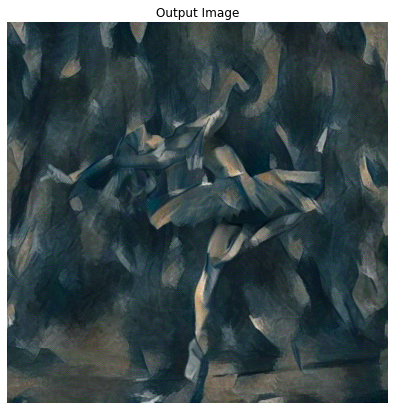

<Figure size 720x720 with 0 Axes>

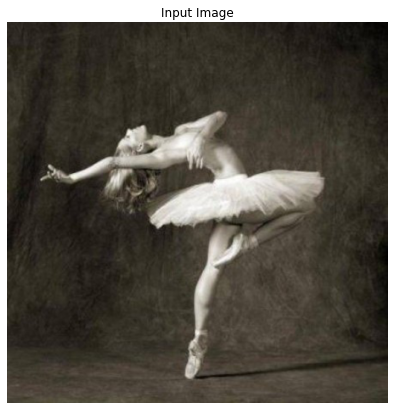

In [15]:
output_img = run_style_transfer(cnn, content_img, style_img, input_img)

plt.figure(figsize=(10,10))
imshow(output_img, title='Output Image')
plt.figure(figsize=(10,10))
imshow(content_img, title='Input Image')
plt.show()


Layer Name: Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


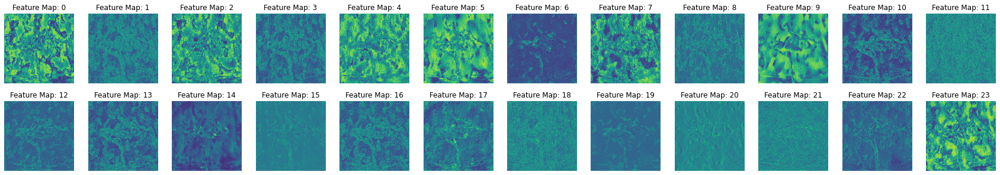

Layer Name: ReLU()


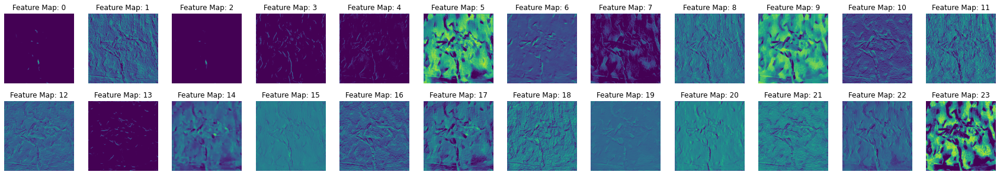

Layer Name: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


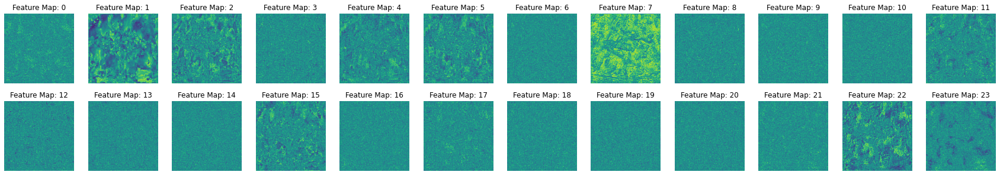

Layer Name: ReLU()


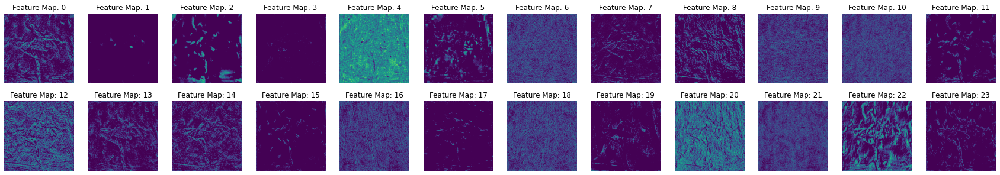

Layer Name: AvgPool2d(kernel_size=2, stride=2, padding=0)


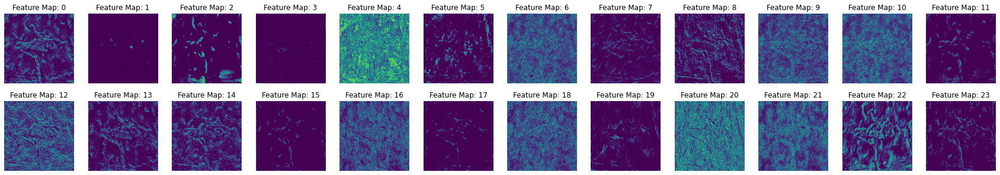

Layer Name: Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


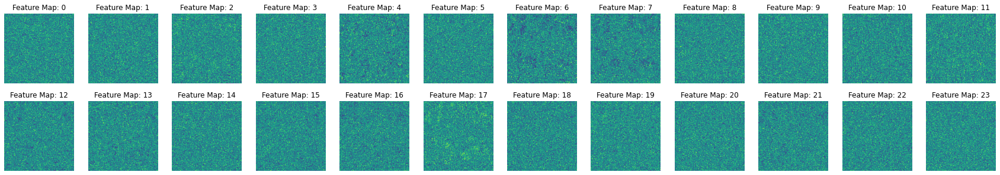

Layer Name: ReLU()


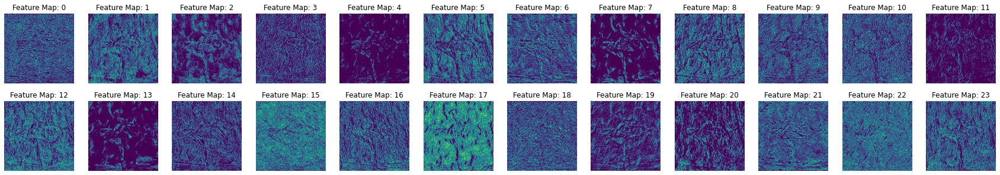

Layer Name: Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


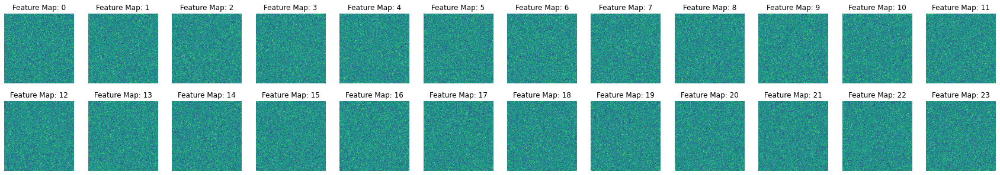

Layer Name: ReLU()


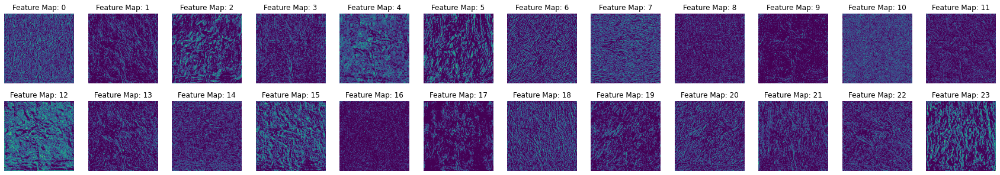

Layer Name: AvgPool2d(kernel_size=2, stride=2, padding=0)


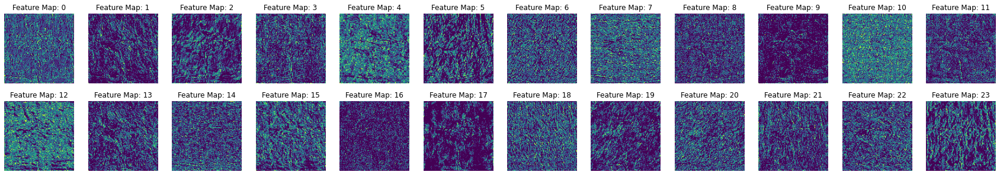

Layer Name: Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


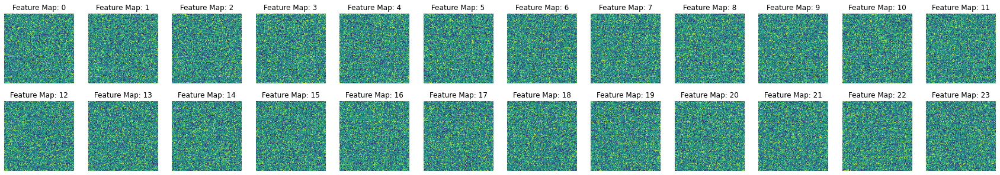

Layer Name: ReLU()


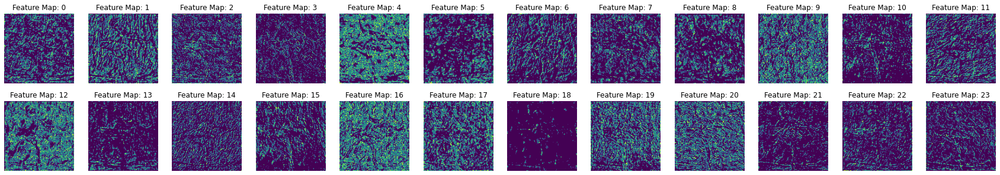

Layer Name: Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


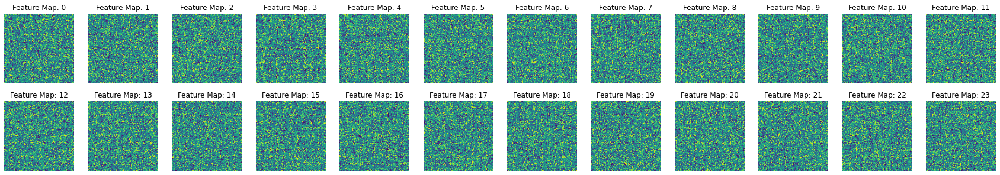

Layer Name: ReLU()


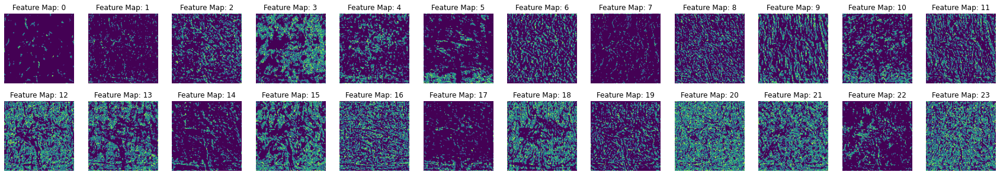

In [16]:
for i, name in zip(visualizations,visualizations.keys()):
    print(f'Layer Name: {name}')
    normalize = visualizations[i].shape[0]
    summed = torch.sum(visualizations[i],dim=0)

    fig,axs = plt.subplots(2,12,figsize=(30,5))
    for a,ax in enumerate(axs.ravel()):
        image = unloader(visualizations[i][a].cpu().clone().squeeze(0))
        ax.set_title(f'Feature Map: {a}')
        ax.axis('off')
        ax.imshow(image)
    plt.pause(0.001)

# Feature Visualization

Use these functions in console

### Using Hooks

In [17]:
layer_name = ['conv_0','relu_1','conv_2','relu_3','pool_4','conv_5','relu_6','conv_7','relu_8','pool_9','conv_10','relu_11','conv_12','relu_13','conv_14','relu_15','conv_16',
              'relu_17','pool_18','conv_19','relu_20','conv_21','relu_22','conv_23','relu_24','conv_25','relu_26','pool_27','conv_28','relu_29','conv_30','relu_31','conv_32',
              'relu_33','conv_34','relu_35','pool_36']

In [18]:
#Visulaiztions
"""
    4 Ways to do it:
        1) Run the hooks for the training cycle of the model that has been defined above(Has been done already above)
        2) Run the hooks for CNN(Transfer learning model) with content img
        3) Run the hooks for the CNN(Transfer Learning model) with style img
        4) Run the hooks for the CNN(Transfer Learning model) with output img of trained model
"""
def normalized_feature_map_plotting():
    """
        This function takes the visualizations from the hooked layers of CNN(the transfered Learned VGG CNN) with a given image (style_img,content_img or output of the trained model)
        After getting the visualizations of a specific layer, those visualizations are averaged and then displayed. This is repeated for each layer in the CNN depending on where the 
        cutoff is.
        
        The goal is to give a broad representation of what kind of detail the network is capturing based on the depth of the network.
    """
    fig,axs =plt.subplots(4,int(len(visualizations)/4+1),figsize=(30,10))
    for ax,i,name in zip(axs.ravel(),visualizations,layer_name):
        normalize = visualizations[i].shape[0]
        summed = torch.sum(visualizations[i],dim=0)/normalize
        image = unloader(summed.cpu().clone().squeeze(0))
        ax.set_title(name)
        ax.axis('off')
        ax.imshow(image)

def feature_maps_plotting():
    """
        This function takes the visualizations from the hooked layers of CNN(transefered Learned VGG CNN) with a given image(style_img,content_img or output of the trained model)
        After getting the visualizations of a specific layer, the function plots the first 24 features maps of the layer. This is repeated for each layer in the CNN depending on where
        the cutoff for the model is.
        
        The goal is to plot feature maps of each layer without having to segment the model and rerun it multiple times.
    """
    for i, name in zip(visualizations,layer_name):
        print(f'Layer Name: {name}')
        normalize = visualizations[i].shape[0]
        summed = torch.sum(visualizations[i],dim=0)

        fig,axs = plt.subplots(2,12,figsize=(30,5))
        for a,ax in enumerate(axs.ravel()):
            image = unloader(visualizations[i][a].cpu().clone().squeeze(0))
            ax.set_title(f'Feature Map: {a}')
            ax.axis('off')
            ax.imshow(image)
        plt.pause(0.001)

def vis_feature_maps_hooks(feature_image, plot_type='standard'):
    assert plot_type in ['standard','normalized']
    hook_them_layers(cnn)
    cnn(feature_image)
    
    if plot_type == 'normalized':
        normalized_feature_map_plotting()
    else:
        feature_maps_plotting()
    

### Segmenting the Model

Cutoff the model at the deseired layer and visualize the output, doesn't use hooks

In [19]:
def feature_map_vis_segmentation(name='relu_1',loss_type='style'):
    """
        The function will take the desired layer (name) and cutoff the CNN at that layer after doing so a "Style" or "Content" loss layer will 
        be inserted after that cutoff and the model will be run to minimise the loss of the custom layer.
        The output will be the feature maps of the cutoff layer of which the zeroth index is plotted.
        ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
        
        Parameters:------------------------------------------------------------------------
        name: name of the layer for the renamed model name or a name for the layer_name variable
        loss_type: must be content or style depending on the type the model will utlize that layer to minimise loss
    """
    assert loss_type in ['content','style']
    
    if loss_type == 'content':
        content_layers_default = name
    elif loss_type == 'style':
        style_layers_default =  name
    else:
        print('you done goofed (⌐■_■) (ಠ_ಠ)>⌐■-■')
        print('Layer type not recognized, it must be "style" or "content" ')
        print('pretty sure u shouldnt be here o_O')

    model,s,c = get_style_model_and_losses(cnn,style_img,content_img)
    output = model(content_img)
    #imshow(output.squeeze(0)[0])
    fig,axs = plt.subplots(2,12,figsize=(30,5))
    for a,ax in enumerate(axs.ravel()):
        image = unloader((output.cpu().clone().squeeze(0)[a]))
        ax.set_title(f'Feature Map: {a}')
        ax.axis('off')
        ax.imshow(image)
    plt.pause(0.001)
    print(output.shape)

In [20]:
def feature_extraction_vis(name='relu_1',loss_type='style',steps=80):
    """
        The function will take the desired layer (name) and cutoff the CNN at that layer after doing so a "Style" or "Content" loss layer will 
        be inserted after that cutoff and the model will be run to minimise the loss of the custom layer.
        
        The output will show the features extracted by the CNN from the style image or content image based on how many layers were
        included from the original VGG CNN. Thus showing the features extracted by the CNN based on depth of model
        ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
        
        Parameters:---------------------------------------------------------
        name: must be one of the layer names defined in the layer_name variable
        loss_type: must be content or style depending on the type the model will utlize that layer to minimise loss
        steps: how many iteration to run the model for personally 100 is more then enough u can even get away with 10
    """
    assert loss_type in ['content','style']
    
    if loss_type == 'content':
        content_layers_default = name
    elif loss_type == 'style':
        style_layers_default =  name
    else:
        print('you done goofed (⌐■_■) (ಠ_ಠ)>⌐■-■')
        print('Layer type not recognized, it must be "style" or "content" ')
        print('pretty sure u shouldnt be here o_O')
    
    input_img = torch.randn(content_img.data.size(), device=device)
    output = run_style_transfer(cnn, content_img,style_img,input_img,num_steps=steps)
    imshow(output)